# Install pkgs

**Note:** This is training notebook only. Inference ain't included in . 
Anybody who wants to use this notebook for inference purposes is most welcome.

In [1]:
import os
import shutil
import numpy as np
from pathlib import Path
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.utils.checkpoint as checkpoint
from torch.utils.data import Dataset, DataLoader
import torchinfo
from torch.utils.tensorboard import SummaryWriter
import zarr, copick
from tqdm import tqdm
import napari
import mlflow
import mlflow.pytorch
from copick_utils.segmentation import segmentation_from_picks
import copick_utils.writers.write as write
from collections import defaultdict
import matplotlib.pyplot as plt
import pandas as pd
import gc
import concurrent.futures
import optuna, optunahub
from optuna.visualization import plot_slice, plot_param_importances
import json
import copy
import random
from sklearn.cluster import DBSCAN

gc.enable()

In [2]:
torch._dynamo.config.cache_size_limit = 64
torch.backends.cudnn.benchmark = True

In [3]:
notebook_number = '20250204_01'

In [4]:
path = '/media/max1024/Extreme SSD1/Kaggle/czii-cryo-et-object-identification/'
output_path = path + 'output/'

In [5]:
# Make a copick project

config_blob = """{
    "name": "czii_cryoet_mlchallenge_2024",
    "description": "2024 CZII CryoET ML Challenge training data.",
    "version": "1.0.0",

    "pickable_objects": [
        {
            "name": "apo-ferritin",
            "is_particle": true,
            "pdb_id": "4V1W",
            "label": 1,
            "color": [  0, 117, 220, 128],
            "radius": 60,
            "map_threshold": 0.0418
        },
        {
            "name": "beta-galactosidase",
            "is_particle": true,
            "pdb_id": "6X1Q",
            "label": 2,
            "color": [ 76,   0,  92, 128],
            "radius": 90,
            "map_threshold": 0.0578
        },
        {
            "name": "ribosome",
            "is_particle": true,
            "pdb_id": "6EK0",
            "label": 3,
            "color": [  0,  92,  49, 128],
            "radius": 150,
            "map_threshold": 0.0374
        },
        {
            "name": "thyroglobulin",
            "is_particle": true,
            "pdb_id": "6SCJ",
            "label": 4,
            "color": [ 43, 206,  72, 128],
            "radius": 130,
            "map_threshold": 0.0278
        },
        {
            "name": "virus-like-particle",
            "is_particle": true,
            "label": 5,
            "color": [255, 204, 153, 128],
            "radius": 135,
            "map_threshold": 0.201
        }
    ],

    "overlay_root": "/media/max1024/Extreme SSD1/Kaggle/czii-cryo-et-object-identification/output/overlay",

    "overlay_fs_args": {
        "auto_mkdir": true
    },

    "static_root": "/media/max1024/Extreme SSD1/Kaggle/czii-cryo-et-object-identification/train/static"
}"""

copick_config_path = path + "output/copick.config"
output_overlay = path + "output/overlay"

with open(copick_config_path, "w") as f:
    f.write(config_blob)
    
# Update the overlay
# Define source and destination directories
source_dir = path + 'train/overlay'
destination_dir = path + 'output/overlay'

# Walk through the source directory
def some_function():
    for root, dirs, files in os.walk(source_dir):
        # Create corresponding subdirectories in the destination
        relative_path = os.path.relpath(root, source_dir)
        target_dir = os.path.join(destination_dir, relative_path)
        os.makedirs(target_dir, exist_ok=True)
        
        # Copy and rename each file
        for file in files:
            if file.startswith("curation_0_"):
                new_filename = file
            else:
                new_filename = f"curation_0_{file}"
                
            
            # Define full paths for the source and destination files
            source_file = os.path.join(root, file)
            destination_file = os.path.join(target_dir, new_filename)
            
            # Copy the file with the new name
            shutil.copy2(source_file, destination_file)
            print(f"Copied {source_file} to {destination_file}")

some_function()

Copied /media/max1024/Extreme SSD1/Kaggle/czii-cryo-et-object-identification/train/overlay/ExperimentRuns/TS_5_4/Picks/apo-ferritin.json to /media/max1024/Extreme SSD1/Kaggle/czii-cryo-et-object-identification/output/overlay/ExperimentRuns/TS_5_4/Picks/curation_0_apo-ferritin.json
Copied /media/max1024/Extreme SSD1/Kaggle/czii-cryo-et-object-identification/train/overlay/ExperimentRuns/TS_5_4/Picks/beta-amylase.json to /media/max1024/Extreme SSD1/Kaggle/czii-cryo-et-object-identification/output/overlay/ExperimentRuns/TS_5_4/Picks/curation_0_beta-amylase.json
Copied /media/max1024/Extreme SSD1/Kaggle/czii-cryo-et-object-identification/train/overlay/ExperimentRuns/TS_5_4/Picks/beta-galactosidase.json to /media/max1024/Extreme SSD1/Kaggle/czii-cryo-et-object-identification/output/overlay/ExperimentRuns/TS_5_4/Picks/curation_0_beta-galactosidase.json
Copied /media/max1024/Extreme SSD1/Kaggle/czii-cryo-et-object-identification/train/overlay/ExperimentRuns/TS_5_4/Picks/ribosome.json to /media

# Prepare the dataset

In [6]:
root = copick.from_file(copick_config_path)

copick_user_name = "copickUtils"
copick_segmentation_name = "paintedPicks"
voxel_size = 10
#tomo_type = "denoised"

## 2. Generate multi-class segmentation masks from picks, and saved them to the copick overlay directory (one-time)

In [7]:
root

CopickRoot(user_id=None, len(pickable_objects)=None, len(runs)=None) at 0x7663f9501bb0

In [8]:
def generate_masks_function():
    target_objects = defaultdict(dict)
    for object in root.pickable_objects:
        if object.is_particle:
            target_objects[object.name]['label'] = object.label
            target_objects[object.name]['radius'] = object.radius


    for run in tqdm(root.runs):
        tomo = run.get_voxel_spacing(voxel_size)
        for tomogram in tomo.tomograms:
            tomo_type = tomogram.tomo_type
            if tomo_type != 'denoised':
                continue
            image = tomogram.numpy()
            target = np.zeros(image.shape, dtype=np.uint8)
            for pickable_object in root.pickable_objects:
                pick = run.get_picks(object_name=pickable_object.name, user_id='curation')
                if len(pick):
                    target = segmentation_from_picks.from_picks(pick[0],
                                                                target,
                                                                target_objects[pickable_object.name]['radius'],
                                                                target_objects[pickable_object.name]['label']
                                                               )
            write.segmentation(run, target, copick_user_name, name=copick_segmentation_name)

In [9]:
# Just do this once
generate_masks = True

if generate_masks:
    generate_masks_function()

100%|█████████████████████████████████████████████| 7/7 [00:04<00:00,  1.54it/s]


In [10]:
train_label_experiment_folders_path = '/media/max1024/Extreme SSD1/Kaggle/czii-cryo-et-object-identification/' + 'train/overlay/ExperimentRuns/'

In [11]:
class_ids = {
    'apo-ferritin': 1,
    'beta-galactosidase': 2,
    'ribosome': 3,
    'thyroglobulin': 4,
    'virus-like-particle': 5,
}

In [12]:
particle_radius = {
    'apo-ferritin': 60,
    'beta-galactosidase': 90,
    'ribosome': 150,
    'thyroglobulin': 130,
    'virus-like-particle': 135,
}

In [13]:
def create_labels_df(experiment):
    labels_dict = {}
    
    particle_types_dict = {}
    
    with open(f'{train_label_experiment_folders_path}{experiment}/Picks/apo-ferritin.json') as f:
        loaded_json = json.loads(f.read())
    particle_types_dict['apo-ferritin'] = loaded_json
    
    with open(f'{train_label_experiment_folders_path}{experiment}/Picks/beta-galactosidase.json') as f:
        loaded_json = json.loads(f.read())
    particle_types_dict['beta-galactosidase'] = loaded_json
    
    with open(f'{train_label_experiment_folders_path}{experiment}/Picks/ribosome.json') as f:
        loaded_json = json.loads(f.read())
    particle_types_dict['ribosome'] = loaded_json
    
    with open(f'{train_label_experiment_folders_path}{experiment}/Picks/thyroglobulin.json') as f:
        loaded_json = json.loads(f.read())
    particle_types_dict['thyroglobulin'] = loaded_json
    
    with open(f'{train_label_experiment_folders_path}{experiment}/Picks/virus-like-particle.json') as f:
        loaded_json = json.loads(f.read())
    particle_types_dict['virus-like-particle'] = loaded_json
    
    labels_dict[experiment] = particle_types_dict

    experiment_list = []
    particle_type_list = []
    x_list = []
    y_list = []
    z_list = []
    r_list = []
    class_id_list = []
    #print(experiment)
    #print(len(labels_dict[experiment]['apo-ferritin']['points']))
    #print(type(labels_dict[experiment]['apo-ferritin']['points']))
    #print(labels_dict[experiment]['apo-ferritin']['points'][0])

    for key in labels_dict[experiment].keys():
        #print(labels_dict[experiment][key])
        #print(labels_dict[experiment][key]['pickable_object_name'])
        for i in range(len(labels_dict[experiment][key]['points'])):
            experiment_list.append(labels_dict[experiment][key]['run_name'])
            particle_type_list.append(labels_dict[experiment][key]['pickable_object_name'])
            x_list.append(labels_dict[experiment][key]['points'][i]['location']['x']/10.012444537618887)
            y_list.append(labels_dict[experiment][key]['points'][i]['location']['y']/10.012444196428572)
            z_list.append(labels_dict[experiment][key]['points'][i]['location']['z']/10.012444196428572)
            r_list.append(particle_radius[key]/10)
            class_id_list.append(class_ids[key])

    labels_df = pd.DataFrame({'experiment':experiment_list, 'particle_type':particle_type_list, 'x':x_list, 'y':y_list, 'z':z_list, 'radius':r_list, 'label':class_id_list})
    
    return labels_df

In [14]:
# Define enzyme radii
particle_radius = {
    'apo-ferritin': 60 / 10,
    'beta-galactosidase': 90 / 10,
    'ribosome': 150 / 10,
    'thyroglobulin': 130 / 10,
    'virus-like-particle': 135 / 10,
}

# Map enzyme names to numerical class labels (for segmentation)
enzyme_class_mapping = {
    'apo-ferritin': 1,
    'beta-galactosidase': 2,
    'ribosome': 3,
    'thyroglobulin': 4,
    'virus-like-particle': 5,
}

In [15]:
def create_normalized_distance_transform_maps(image_shape, locations_df):
    """
    Creates a 5-channel normalized distance transform volume (one channel per enzyme class).
    For each enzyme instance, within a spherical region (defined by its radius), each voxel
    is assigned a value of 1 - (distance from center / radius), with voxels outside the sphere set to 0.
    
    Args:
        image_shape (tuple of int): The shape of the 3D volume (z, y, x).
        locations_df (pandas.DataFrame): DataFrame with columns ['z', 'y', 'x', 'particle_type'].
                                         Each row represents an enzyme instance.
                                         It is assumed that `particle_radius` and `enzyme_class_mapping`
                                         are defined globally or available in the scope.
    
    Returns:
        ndt_maps (np.ndarray): A numpy array of shape (5, z, y, x) with the normalized distance maps.
    """
    num_classes = 5
    ndt_maps = np.zeros((num_classes,) + image_shape, dtype=np.float32)

    # Get the center coordinates and enzyme type for each instance.
    centers = locations_df[['z', 'y', 'x']].values
    enzyme_names = locations_df['particle_type'].values

    for center, enzyme_name in zip(centers, enzyme_names):
        if enzyme_name not in particle_radius:
            continue

        # Retrieve the radius and class information.
        radius = particle_radius[enzyme_name]
        class_label = enzyme_class_mapping[enzyme_name]  # Should map to 1-5
        channel_idx = class_label - 1  # Convert to 0-based index

        # Determine the bounding box for the sphere.
        # Use floor/ceil to ensure the sphere is fully captured.
        z_min = max(0, int(np.floor(center[0] - radius)))
        z_max = min(image_shape[0], int(np.ceil(center[0] + radius)) + 1)
        y_min = max(0, int(np.floor(center[1] - radius)))
        y_max = min(image_shape[1], int(np.ceil(center[1] + radius)) + 1)
        x_min = max(0, int(np.floor(center[2] - radius)))
        x_max = min(image_shape[2], int(np.ceil(center[2] + radius)) + 1)

        if z_min >= z_max or y_min >= y_max or x_min >= x_max:
            continue

        # Create a local grid for the bounding box.
        zz, yy, xx = np.meshgrid(
            np.arange(z_min, z_max),
            np.arange(y_min, y_max),
            np.arange(x_min, x_max),
            indexing='ij'
        )

        # Compute the Euclidean distance from each voxel to the center.
        dz = zz - center[0]
        dy = yy - center[1]
        dx = xx - center[2]
        dist = np.sqrt(dx**2 + dy**2 + dz**2)

        # Compute the normalized distance transform values.
        # Voxels within the sphere get a value 1 - (distance/radius), and voxels outside are 0.
        ndt = 1 - (dist / radius)
        ndt[dist > radius] = 0  # Zero out values outside the sphere.
        ndt = np.clip(ndt, 0, 1)  # Ensure values are within [0, 1].

        # Combine with the existing map using maximum (to handle overlaps).
        ndt_maps[channel_idx, z_min:z_max, y_min:y_max, x_min:x_max] = np.maximum(
            ndt_maps[channel_idx, z_min:z_max, y_min:y_max, x_min:x_max],
            ndt
        )

    return ndt_maps

In [16]:
def create_data():
    images_list = []
    radius_maps_list = []
    segmentations_list = []
    label_dfs_list = []
    
    for run in tqdm(root.runs):
        tomo = run.get_voxel_spacing(voxel_size)#.get_tomograms(tomo_type)[0].numpy()
        labels_df = create_labels_df(run.name)
        for tomogram in tomo.tomograms:
            tomo_type = tomogram.tomo_type
            if tomo_type != 'denoised':
                continue
            image = tomogram.numpy()
            segmentation = run.get_segmentations(name=copick_segmentation_name, user_id=copick_user_name, voxel_size=voxel_size, is_multilabel=True)[0].numpy()
            segmentations_list.append(segmentation)
            images_list.append(image)

            radius_map = create_normalized_distance_transform_maps(image.shape, labels_df)
            radius_maps_list.append(radius_map)
            
            label_dfs_list.append(labels_df)

    images_array = np.array(images_list)
    segmentations_array = np.array(segmentations_list)
    radius_maps_array = np.array(radius_maps_list)

    images_array = np.expand_dims(images_array, axis=1)
    segmentations_array = np.expand_dims(segmentations_array, axis=1)

    return images_array, segmentations_array, radius_maps_array, label_dfs_list

In [17]:
images_array, segmentations_array, radius_maps_array, label_dfs_list = create_data()

100%|█████████████████████████████████████████████| 7/7 [00:03<00:00,  1.80it/s]


In [18]:
images_array.shape

(7, 1, 184, 630, 630)

In [19]:
segmentations_array.shape

(7, 1, 184, 630, 630)

In [20]:
radius_maps_array.shape

(7, 5, 184, 630, 630)

In [21]:
label_dfs_list[0]

,experiment,particle_type,x,y,z,radius,label
0,TS_5_4,apo-ferritin,46.793168,590.855328,60.341610,0.60,1
1,TS_5_4,apo-ferritin,566.764088,111.296900,56.436569,0.60,1
2,TS_5_4,apo-ferritin,573.736911,104.786801,65.289952,0.60,1
3,TS_5_4,apo-ferritin,587.345975,112.394934,57.883968,0.60,1
4,TS_5_4,apo-ferritin,465.587298,126.791918,80.940176,0.60,1
...,...,...,...,...,...,...,...
125,TS_5_4,virus-like-particle,263.326203,420.974132,96.421012,1.35,5
126,TS_5_4,virus-like-particle,313.349651,356.801989,37.245052,1.35,5
127,TS_5_4,virus-like-particle,329.003870,302.370125,67.323222,1.35,5
128,TS_5_4,virus-like-particle,299.396016,494.206799,116.792162,1.35,5


In [22]:
exp_names_list = []
for i in range(len(label_dfs_list)):
    exp_name = label_dfs_list[i]['experiment'][0]
    exp_names_list.append(exp_name)
exp_names_sr = pd.Series(exp_names_list)
unique_exp_names = exp_names_sr.unique()
unique_exp_names

array(['TS_5_4', 'TS_69_2', 'TS_6_4', 'TS_6_6', 'TS_73_6', 'TS_86_3',
       'TS_99_9'], dtype=object)

# Visualize the tomogram and radius maps

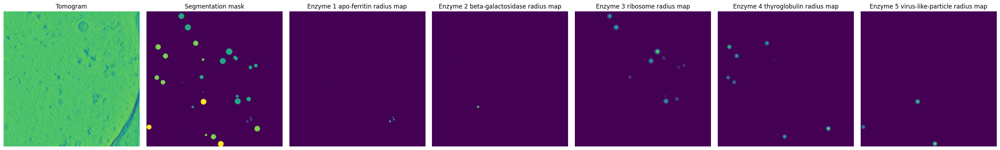

In [23]:
# Create figure
fig, axes = plt.subplots(1, 7, figsize=(28, 4))  # Adjust figsize to control spacing

# Image 1
axes[0].imshow(images_array[0][0][100])
axes[0].set_title('Tomogram')
axes[0].axis('off')

# Image 2
axes[1].imshow(segmentations_array[0][0][100])
axes[1].set_title('Segmentation mask')
axes[1].axis('off')

# Image 3
axes[2].imshow(radius_maps_array[0][0][100])
axes[2].set_title('Enzyme 1 apo-ferritin radius map')
axes[2].axis('off')

# Image 4
axes[3].imshow(radius_maps_array[0][1][100])
axes[3].set_title('Enzyme 2 beta-galactosidase radius map')
axes[3].axis('off')

# Image 5
axes[4].imshow(radius_maps_array[0][2][100])
axes[4].set_title('Enzyme 3 ribosome radius map')
axes[4].axis('off')

# Image 6
axes[5].imshow(radius_maps_array[0][3][100])
axes[5].set_title('Enzyme 4 thyroglobulin radius map')
axes[5].axis('off')

# Image 7
axes[6].imshow(radius_maps_array[0][4][100])
axes[6].set_title('Enzyme 5 virus-like-particle radius map')
axes[6].axis('off')

# Reduce spacing
plt.subplots_adjust(wspace=0.05)  # Reduce horizontal space between images
plt.tight_layout(pad=0.1, w_pad=0.1, h_pad=0.1)  # Further minimize padding

plt.show()

# Simulated data prep

In [24]:
#simulated_data_path = '../../czii_downloaded_data/simulated_training_data/'

In [25]:
#simulated_experiments_list = [f for f in os.listdir(simulated_data_path) if 'TS_' in f]
#simulated_experiments_list

In [26]:
'''
particle_info = {
    "apo-ferritin": {"label": 1, "radius": 60},
    "beta-galactosidase": {"label": 2, "radius": 90},
    "ribosome": {"label": 3, "radius": 150},
    "thyroglobulin": {"label": 4, "radius": 130},
    "virus-like-particle": {"label": 5, "radius": 135}
}
'''

'\nparticle_info = {\n    "apo-ferritin": {"label": 1, "radius": 60},\n    "beta-galactosidase": {"label": 2, "radius": 90},\n    "ribosome": {"label": 3, "radius": 150},\n    "thyroglobulin": {"label": 4, "radius": 130},\n    "virus-like-particle": {"label": 5, "radius": 135}\n}\n'

In [27]:
'''
particle_name_dict = {
    'ferritin':'apo-ferritin',
    'galacto':'beta-galactosidase',
    'ribosome':'ribosome',
    'thyro':'thyroglobulin',
    'vlp':'virus-like-particle'
}
'''

"\nparticle_name_dict = {\n    'ferritin':'apo-ferritin',\n    'galacto':'beta-galactosidase',\n    'ribosome':'ribosome',\n    'thyro':'thyroglobulin',\n    'vlp':'virus-like-particle'\n}\n"

In [28]:
def process_experiment(experiment):
    """Process a single experiment in parallel"""
    # Load tomogram data
    tomogram_path = f'{simulated_data_path}{experiment}/Reconstructions/VoxelSpacing10.000/Tomograms/100/{experiment}.zarr'
    tomogram = zarr.open(tomogram_path, mode='r')[0].__array__()
    
    location_dfs_list = []
    annotations_base = f'{simulated_data_path}{experiment}/Reconstructions/VoxelSpacing10.000/Annotations/'
    
    # Process location files
    for location_folder in os.listdir(annotations_base):
        location_dir = os.path.join(annotations_base, location_folder)
        for location_file in os.listdir(location_dir):
            if 'orientedpoint.ndjson' not in location_file:
                continue
                
            # Determine particle type
            particle_type = None
            for key in particle_name_dict.keys():
                if key in location_file:
                    particle_type = particle_name_dict[key]
                    break
            if not particle_type:
                continue
                
            # Process NDJSON file
            label = particle_info[particle_type]['label']
            radius = particle_info[particle_type]['radius']
            file_path = os.path.join(location_dir, location_file)
            
            location_df = pd.read_json(file_path, lines=True)
            location_df['x'] = location_df['location'].map(lambda x: x['x'])
            location_df['y'] = location_df['location'].map(lambda x: x['y'])
            location_df['z'] = location_df['location'].map(lambda x: x['z'])
            location_df['label'] = label
            location_df['radius'] = radius / 10.012444
            location_df['particle_type'] = particle_type
            
            location_dfs_list.append(location_df)
    
    # Create mask and return result
    if location_dfs_list:
        all_particle_locations_df = pd.concat(location_dfs_list, ignore_index=True)
        mask_image = create_gaussian_heatmaps(tomogram.shape, all_particle_locations_df)
        all_particle_locations_df['experiment'] = experiment
        label_df = all_particle_locations_df[['experiment', 'particle_type', 'x', 'y', 'z', 'radius', 'label']]
        return {"tomo_type": 'Unknown', "image": tomogram, "label": mask_image, "label_df": label_df}
    return None

def append_simulation_data():
    global data_dicts
    max_workers = os.cpu_count() // 2  # Use half the available cores to prevent memory issues
    
    with concurrent.futures.ProcessPoolExecutor(max_workers=max_workers) as executor:
        # Submit all experiments for processing
        futures = [executor.submit(process_experiment, exp) for exp in simulated_experiments_list]
        
        # Collect results as they complete
        for future in tqdm(concurrent.futures.as_completed(futures), 
                         total=len(simulated_experiments_list),
                         desc="Processing experiments"):
            result = future.result()
            if result:
                data_dicts.append(result)

In [29]:
#append_simulation_data()

# Dataloaders

In [30]:
from monai.transforms import Compose, EnsureChannelFirst, NormalizeIntensity, Orientation, RandGaussianNoise, RandRotate90, RandFlip, RandSpatialCrop, RandAdjustContrast, RandCropByLabelClasses

num_classes = 6 # 1 background + 5 enzymes
my_num_samples = 16
loader_workers = 8
cube_size = 160
batch_size = 1

# Non-random transforms to be cached
non_random_transforms = Compose([
    EnsureChannelFirst(channel_dim=0),
    Orientation(axcodes="RAS"),
])

images_only_transforms = Compose([
    NormalizeIntensity(),
    #RandGaussianNoise(prob=0.2, std=0.01),
    RandAdjustContrast(prob=0.5, gamma=(0.7, 1.3)),  # Random contrast change
])

random_transforms = Compose([
    RandRotate90(prob=0.5, spatial_axes=(1, 2)),
    RandFlip(prob=0.5, spatial_axis=0),
    RandSpatialCrop(roi_size=(cube_size, cube_size, cube_size), random_center=True),
])

val_images_only_transforms = Compose([
    NormalizeIntensity(),
])

class EnzymeDataset(Dataset):
    def __init__(self, images, segmentations, radius_maps, non_random_transform=None, image_only_transform=None, transform=None):
        """
        Args:
            images: np.ndarray/tensor of shape (num_samples, 1, D, H, W)
            heatmaps: np.ndarray/tensor of shape (num_samples, 5, D, H, W)
            transform: Callable transform to apply to both image and heatmap
        """
        self.images = torch.as_tensor(images, dtype=torch.float32)
        self.segmentations = torch.as_tensor(segmentations, dtype=torch.float32)
        self.radius_maps = torch.as_tensor(radius_maps, dtype=torch.float32)
        
        self.non_random_transform = non_random_transform
        self.image_only_transform = image_only_transform
        self.transform = transform

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        image = self.images[idx]  # Shape: (1, D, H, W)
        segmentation = self.segmentations[idx]  # Shape: (1, D, H, W)
        radius_map = self.radius_maps[idx]  # Shape: (5, D, H, W)

        if self.non_random_transform:
            combined = torch.cat([image, segmentation, radius_map], dim=0)
            combined = self.non_random_transform(combined)
            image = combined[0:1]
            segmentation = combined[1:2]
            radius_map = combined[2:]

        if self.image_only_transform:
            image = self.image_only_transform(image)
            

        if self.transform:
            # Apply the same spatial transform to all image, segmentation and radius map
            # Concatenate to process together (channel dimension becomes 1+1+5=7)
            combined = torch.cat([image, segmentation, radius_map], dim=0)  # (7, D, H, W)
            combined = self.transform(combined)
            
            # Split back into image and heatmap
            image = combined[0:1]  # (1, D, H, W)
            segmentation = combined[1:2]  # (1, D, H, W)
            radius_map = combined[2:]  # (5, D, H, W)

        return image, segmentation, radius_map

In [31]:
train_images_array = images_array[2:]
train_images_array.shape

(5, 1, 184, 630, 630)

In [32]:
train_segmentations_array = segmentations_array[2:]
train_segmentations_array.shape

(5, 1, 184, 630, 630)

In [33]:
train_radius_maps_array = radius_maps_array[2:]
train_radius_maps_array.shape

(5, 5, 184, 630, 630)

In [34]:
val_images_array = images_array[:2]
val_images_array.shape

(2, 1, 184, 630, 630)

In [35]:
val_segmentations_array = segmentations_array[:2]
val_segmentations_array.shape

(2, 1, 184, 630, 630)

In [36]:
val_radius_maps_array = radius_maps_array[:2]
val_radius_maps_array.shape

(2, 5, 184, 630, 630)

In [37]:
# Create dataset and dataloader
train_dataset = EnzymeDataset(train_images_array, train_segmentations_array, train_radius_maps_array, non_random_transforms, images_only_transforms, random_transforms)
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=loader_workers, pin_memory=True, persistent_workers=True)

In [38]:
val_dataset = EnzymeDataset(val_images_array, val_segmentations_array, val_radius_maps_array, non_random_transforms, val_images_only_transforms, random_transforms)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=True, num_workers=loader_workers, pin_memory=True, persistent_workers=True)

In [39]:
train_label_dfs = label_dfs_list[2:]
len(train_label_dfs)

5

In [40]:
val_label_dfs = label_dfs_list[:2]
len(val_label_dfs)

2

# Competition metric

In [41]:
"""
Derived from:
https://github.com/cellcanvas/album-catalog/blob/main/solutions/copick/compare-picks/solution.py
"""

import numpy as np
import pandas as pd

from scipy.spatial import KDTree


class ParticipantVisibleError(Exception):
    pass


def compute_metrics(reference_points, reference_radius, candidate_points):
    num_reference_particles = len(reference_points)
    num_candidate_particles = len(candidate_points)

    if len(reference_points) == 0:
        return 0, num_candidate_particles, 0

    if len(candidate_points) == 0:
        return 0, 0, num_reference_particles

    ref_tree = KDTree(reference_points)
    candidate_tree = KDTree(candidate_points)
    raw_matches = candidate_tree.query_ball_tree(ref_tree, r=reference_radius)
    matches_within_threshold = []
    for match in raw_matches:
        matches_within_threshold.extend(match)
    # Prevent submitting multiple matches per particle.
    # This won't be be strictly correct in the (extremely rare) case where true particles
    # are very close to each other.
    matches_within_threshold = set(matches_within_threshold)
    tp = int(len(matches_within_threshold))
    fp = int(num_candidate_particles - tp)
    fn = int(num_reference_particles - tp)
    return tp, fp, fn


def score(
        solution: pd.DataFrame,
        submission: pd.DataFrame,
        row_id_column_name: str,
        distance_multiplier: float,
        beta: int) -> float:
    '''
    F_beta
      - a true positive occurs when
         - (a) the predicted location is within a threshold of the particle radius, and
         - (b) the correct `particle_type` is specified
      - raw results (TP, FP, FN) are aggregated across all experiments for each particle type
      - f_beta is calculated for each particle type
      - individual f_beta scores are weighted by particle type for final score
    '''

    particle_radius = {
        'apo-ferritin': 60,
        'beta-amylase': 65,
        'beta-galactosidase': 90,
        'ribosome': 150,
        'thyroglobulin': 130,
        'virus-like-particle': 135,
    }

    weights = {
        'apo-ferritin': 1,
        'beta-amylase': 0,
        'beta-galactosidase': 2,
        'ribosome': 1,
        'thyroglobulin': 2,
        'virus-like-particle': 1,
    }

    particle_radius = {k: v * distance_multiplier for k, v in particle_radius.items()}

    # Filter submission to only contain experiments found in the solution split
    split_experiments = set(solution['experiment'].unique())
    submission = submission.loc[submission['experiment'].isin(split_experiments)]

    # Only allow known particle types
    if not set(submission['particle_type'].unique()).issubset(set(weights.keys())):
        raise ParticipantVisibleError('Unrecognized `particle_type`.')

    assert solution.duplicated(subset=['experiment', 'x', 'y', 'z']).sum() == 0
    assert particle_radius.keys() == weights.keys()

    results = {}
    for particle_type in solution['particle_type'].unique():
        results[particle_type] = {
            'total_tp': 0,
            'total_fp': 0,
            'total_fn': 0,
        }

    for experiment in split_experiments:
        for particle_type in solution['particle_type'].unique():
            reference_radius = particle_radius[particle_type]
            select = (solution['experiment'] == experiment) & (solution['particle_type'] == particle_type)
            reference_points = solution.loc[select, ['x', 'y', 'z']].values

            select = (submission['experiment'] == experiment) & (submission['particle_type'] == particle_type)
            candidate_points = submission.loc[select, ['x', 'y', 'z']].values

            if len(reference_points) == 0:
                reference_points = np.array([])
                reference_radius = 1

            if len(candidate_points) == 0:
                candidate_points = np.array([])

            tp, fp, fn = compute_metrics(reference_points, reference_radius, candidate_points)

            results[particle_type]['total_tp'] += tp
            results[particle_type]['total_fp'] += fp
            results[particle_type]['total_fn'] += fn

    aggregate_fbeta = 0.0
    for particle_type, totals in results.items():
        tp = totals['total_tp']
        fp = totals['total_fp']
        fn = totals['total_fn']

        precision = tp / (tp + fp) if tp + fp > 0 else 0
        recall = tp / (tp + fn) if tp + fn > 0 else 0
        fbeta = (1 + beta**2) * (precision * recall) / (beta**2 * precision + recall) if (precision + recall) > 0 else 0.0
        aggregate_fbeta += fbeta * weights.get(particle_type, 1.0)

    if weights:
        aggregate_fbeta = aggregate_fbeta / sum(weights.values())
    else:
        aggregate_fbeta = aggregate_fbeta / len(results)
    return aggregate_fbeta

In [42]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(device)

cuda


# Helper functions

In [43]:
id_to_name = {1: "apo-ferritin", 
              #2: "beta-amylase",
              2: "beta-galactosidase", 
              3: "ribosome", 
              4: "thyroglobulin", 
              5: "virus-like-particle"}

In [44]:
classes = [1, 2, 3, 4, 5]

In [45]:
from typing import List, Tuple, Union
import cc3d

In [46]:
def extract_3d_patches_minimal_overlap(
    arrays: List[np.ndarray], patch_size: int, overlap: int = 48
) -> Tuple[List[np.ndarray], List[Tuple[int, int, int]]]:
    if not arrays or not isinstance(arrays, list):
        raise ValueError("Input must be a non-empty list of arrays")

    # Verify all arrays have the same shape
    shape = arrays[0].shape
    if not all(arr.shape == shape for arr in arrays):
        raise ValueError("All input arrays must have the same shape")

    if patch_size > min(shape):
        raise ValueError(f"patch_size ({patch_size}) must be smaller than the smallest dimension {min(shape)}")

    m, n, l = shape
    patches = []
    coordinates = []

    # Calculate starting positions for each dimension with fixed overlap
    x_starts = calculate_patch_starts(m, patch_size, overlap)
    y_starts = calculate_patch_starts(n, patch_size, overlap)
    z_starts = calculate_patch_starts(l, patch_size, overlap)

    # Extract patches from each array
    for arr in arrays:
        for x in x_starts:
            for y in y_starts:
                for z in z_starts:
                    patch = arr[
                        x:x + patch_size,
                        y:y + patch_size,
                        z:z + patch_size
                    ]
                    patches.append(patch)
                    coordinates.append((x, y, z))

    return patches, coordinates

In [47]:
def reconstruct_prediction_array(
    patches: List[np.ndarray], 
    coordinates: List[Tuple[int, int, int]], 
    original_shape: Tuple[int, int, int]
) -> np.ndarray:
    """
    Reconstructs the full probability tensor by averaging overlapping patch contributions.
    
    Args:
    - patches: List of predicted probability patches, each with shape (6, 96, 96, 96).
    - coordinates: List of (x, y, z) positions for each patch.
    - original_shape: Tuple (C, D, H, W) for the final tensor shape.
    
    Returns:
    - A tensor of shape (6, 184, 630, 630) with averaged probabilities.
    """
    num_classes = patches[0].shape[0]  # Should be 6

    original_shape = tuple([num_classes] + list(original_shape))
    
    reconstructed = np.zeros(original_shape, dtype=np.float32)  # Stores summed probabilities
    count = np.zeros(original_shape, dtype=np.float32)  # Stores the number of contributions

    patch_size = patches[0].shape[1]  # Should be 96

    for patch, (x, y, z) in zip(patches, coordinates):
        reconstructed[
            :,
            x:x + patch_size,
            y:y + patch_size,
            z:z + patch_size
        ] += patch  # Sum up probabilities
        count[
            :,
            x:x + patch_size,
            y:y + patch_size,
            z:z + patch_size
        ] += 1  # Track contributions

    # Normalize to get the averaged probabilities
    count[count == 0] = 1  # Avoid division by zero
    
    return torch.tensor((reconstructed / count).astype(np.float32))  # Compute the average probability per voxel


def calculate_patch_starts(dimension_size: int, patch_size: int, overlap: int) -> List[int]:
    """
    Calculates the starting indices for patch extraction, ensuring a fixed overlap.
    """
    step = patch_size - overlap
    positions = list(range(0, dimension_size - patch_size + 1, step))

    # Ensure the last patch reaches the end
    if positions[-1] + patch_size < dimension_size:
        positions.append(dimension_size - patch_size)

    return positions

In [48]:
def dict_to_df(coord_dict, experiment_name):
    # Create lists to store data
    all_coords = []
    all_labels = []
    
    # Process each label and its coordinates
    for label, coords in coord_dict.items():
        all_coords.append(coords)
        all_labels.extend([label] * len(coords))
    
    # Concatenate all coordinates
    all_coords = np.vstack(all_coords)
    
    df = pd.DataFrame({
        'experiment': experiment_name,
        'particle_type': all_labels,
        'x': all_coords[:, 0],
        'y': all_coords[:, 1],
        'z': all_coords[:, 2]
    })

    return df

In [49]:
def ensemble_prediction_tta(model, input_tensor):
    probs_list = []
    
    data_copy0 = input_tensor.clone()
    data_copy0 = torch.flip(data_copy0, dims=[2])
    data_copy1 = input_tensor.clone()
    data_copy1 = torch.flip(data_copy1, dims=[3])
    data_copy2 = input_tensor.clone()
    data_copy2 = torch.flip(data_copy2, dims=[4])
    data_copy3 = input_tensor.clone()
    data_copy3 = data_copy3.rot90(1, dims=[3, 4])
    
    model_output0 = model(input_tensor)
    model_output1 = model(data_copy0)
    model_output1 = torch.flip(model_output1, dims=[2])
    model_output2 = model(data_copy1)
    model_output2 = torch.flip(model_output2, dims=[3])
    model_output3 = model(data_copy2)
    model_output3 = torch.flip(model_output3, dims=[4])
    
    probs0 = torch.softmax(model_output0[0], dim=0)
    probs1 = torch.softmax(model_output1[0], dim=0)
    probs2 = torch.softmax(model_output2[0], dim=0)
    probs3 = torch.softmax(model_output3[0], dim=0)
    
    probs_list.append(probs0)
    probs_list.append(probs1)
    probs_list.append(probs2)
    probs_list.append(probs3)
    
    avg_probs = torch.mean(torch.stack(probs_list), dim=0)

    return avg_probs

In [50]:
def predict_centers(volume, model, threshold=0.3):
    """Convert heatmaps to enzyme center coordinates."""
    model.eval()
    with torch.no_grad():
        heatmaps = torch.sigmoid(model(volume.unsqueeze(0).to(device)))[0]
    
    centers = []
    for class_idx in range(5):
        class_heatmap = heatmaps[class_idx].cpu().numpy()
        
        # Find local maxima
        peaks = peak_local_max(
            class_heatmap, 
            min_distance=3,  # Minimum voxels between peaks
            threshold_abs=threshold
        )
        
        # Convert voxel indices to coordinates
        for z, y, x in peaks:
            centers.append({
                'x': x,
                'y': y,
                'z': z,
                'class': class_idx + 1,  # Convert back to 1-5
                'confidence': class_heatmap[z, y, x]
            })
    
    return centers

In [51]:
inference_transforms = Compose([
    EnsureChannelFirst(channel_dim=0),
    NormalizeIntensity(),
    Orientation(axcodes="RAS")
])

# Model setup

In [52]:
from monai.networks.nets import UNet

In [53]:
learning_rate = 0.03
num_res_units = 3
prediction_threshold = 0.05
#validation_experiment = 'TS_86_3'
dropout = 0.3
first_channel_size = 48
prediction_threshold = 0.05

In [54]:
num_classes

6

In [55]:
backbone_model = UNet(
    spatial_dims=3,
    in_channels=1,
    out_channels=num_classes,
    channels=(first_channel_size, first_channel_size*2, first_channel_size*2**2, first_channel_size*2**3),
    strides=(2, 2, 2),
    num_res_units=num_res_units,
    dropout=dropout,
    #kernel_size=3,
)

In [56]:
backbone_model

UNet(
  (model): Sequential(
    (0): ResidualUnit(
      (conv): Sequential(
        (unit0): Convolution(
          (conv): Conv3d(1, 48, kernel_size=(3, 3, 3), stride=(2, 2, 2), padding=(1, 1, 1))
          (adn): ADN(
            (N): InstanceNorm3d(48, eps=1e-05, momentum=0.1, affine=False, track_running_stats=False)
            (D): Dropout(p=0.3, inplace=False)
            (A): PReLU(num_parameters=1)
          )
        )
        (unit1): Convolution(
          (conv): Conv3d(48, 48, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1))
          (adn): ADN(
            (N): InstanceNorm3d(48, eps=1e-05, momentum=0.1, affine=False, track_running_stats=False)
            (D): Dropout(p=0.3, inplace=False)
            (A): PReLU(num_parameters=1)
          )
        )
        (unit2): Convolution(
          (conv): Conv3d(48, 48, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1))
          (adn): ADN(
            (N): InstanceNorm3d(48, eps=1e-05, momentum=0.1, aff

In [57]:
class ModifiedUNet(nn.Module):
    def __init__(self, unet):
        super(ModifiedUNet, self).__init__()
        self.unet = unet

        # Extract all layers except final segmentation layer
        self.encoder_decoder = self.unet.model[:-1]  # This gets up to the last ConvTranspose3d(96, ...)
        self.final_segmentation_layer = self.unet.model[-1]  # The last ConvTranspose3d(96, 6, ...)

    def forward_with_features(self, x):
        # Get the high-resolution feature map (before final segmentation)
        features = self.encoder_decoder(x)  # Output is (1, 96, 80, 80, 80)

        # Final segmentation step (to match segmentation head output)
        seg_out = self.final_segmentation_layer(features)

        return seg_out, features  # Return both segmentation and features

    def forward(self, x):
        seg_out, _ = self.forward_with_features(x)
        return seg_out

In [58]:
mod_unet = ModifiedUNet(backbone_model)

In [59]:
class UNetWithRadius(nn.Module):
    def __init__(self, modified_unet):
        super(UNetWithRadius, self).__init__()
        self.unet = modified_unet  # Use the modified UNet that returns the feature map before segmentation

        # Attach the radius head to the final high-resolution feature map
        self.radius_head = nn.Sequential(
            nn.Conv3d(96, 32, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.Conv3d(32, 5, kernel_size=1),  # 5-channel output for radius maps
            nn.ConvTranspose3d(5, 5, kernel_size=2, stride=2),  # **Upsample to 160x160x160**
            nn.Sigmoid()  # Normalize output
        )

    def forward(self, x):
        seg_out, high_res_features = self.unet.forward_with_features(x)  # Get segmentation + correct feature map
        
        # Compute radius output from high-resolution features
        radius_out = self.radius_head(high_res_features)

        return seg_out, radius_out

In [60]:
model = UNetWithRadius(mod_unet).to(device)

In [61]:
model = torch.compile(model)

In [62]:
model

OptimizedModule(
  (_orig_mod): UNetWithRadius(
    (unet): ModifiedUNet(
      (unet): UNet(
        (model): Sequential(
          (0): ResidualUnit(
            (conv): Sequential(
              (unit0): Convolution(
                (conv): Conv3d(1, 48, kernel_size=(3, 3, 3), stride=(2, 2, 2), padding=(1, 1, 1))
                (adn): ADN(
                  (N): InstanceNorm3d(48, eps=1e-05, momentum=0.1, affine=False, track_running_stats=False)
                  (D): Dropout(p=0.3, inplace=False)
                  (A): PReLU(num_parameters=1)
                )
              )
              (unit1): Convolution(
                (conv): Conv3d(48, 48, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1))
                (adn): ADN(
                  (N): InstanceNorm3d(48, eps=1e-05, momentum=0.1, affine=False, track_running_stats=False)
                  (D): Dropout(p=0.3, inplace=False)
                  (A): PReLU(num_parameters=1)
                )
              )
       

# Loss functions

In [63]:
from monai.losses import DiceLoss, FocalLoss, TverskyLoss, SSIMLoss
#from monai.metrics import DiceMetric, ConfusionMatrixMetric

In [64]:
#dice_loss_function = DiceLoss(include_background=True, to_onehot_y=True, softmax=True)  # softmax=True for multiclass
tversky_loss_function = TverskyLoss(include_background=True, to_onehot_y=True, softmax=True)  # softmax=True for multiclass
#dice_metric = DiceMetric(include_background=False, reduction="mean", ignore_empty=True)  # must use onehot for multiclass
#recall_metric = ConfusionMatrixMetric(include_background=False, metric_name="recall", reduction="None")

In [65]:
l1_loss = nn.L1Loss()

# Training

----------


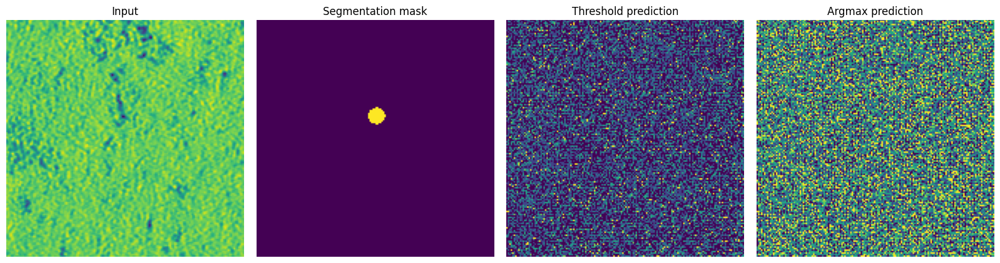

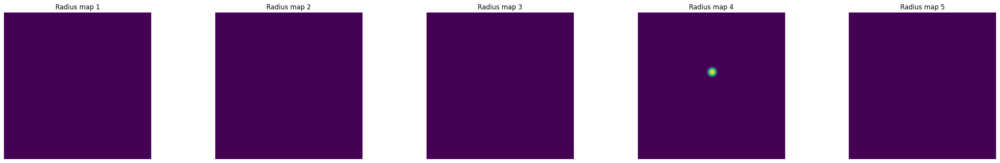

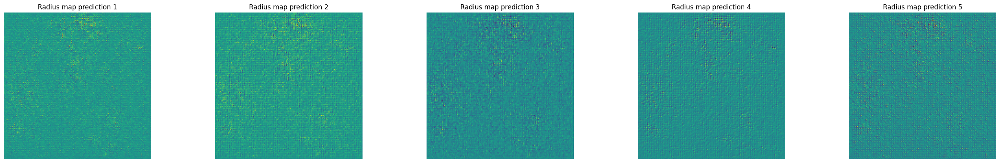

Epoch 1/10000, Train Loss: 0.7884, Val Loss: 0.8362
----------


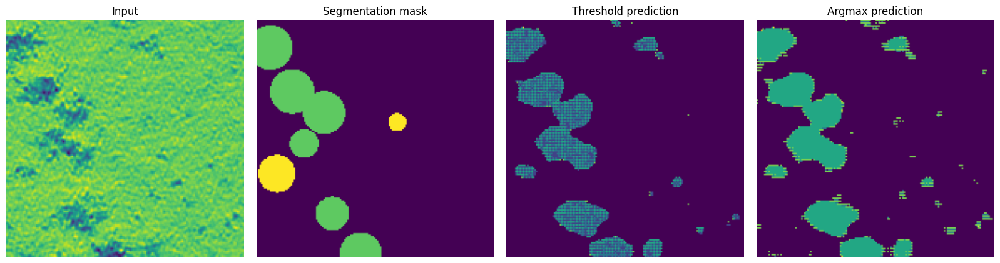

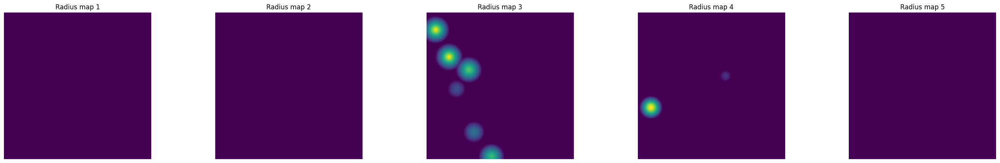

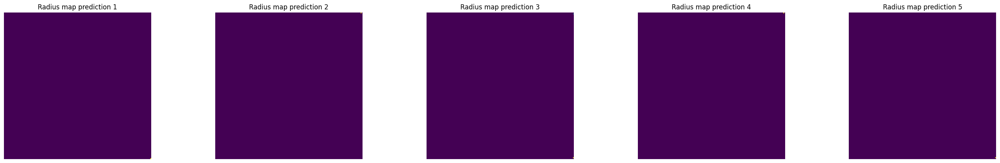

Epoch 2/10000, Train Loss: 0.7680, Val Loss: 0.7771
----------


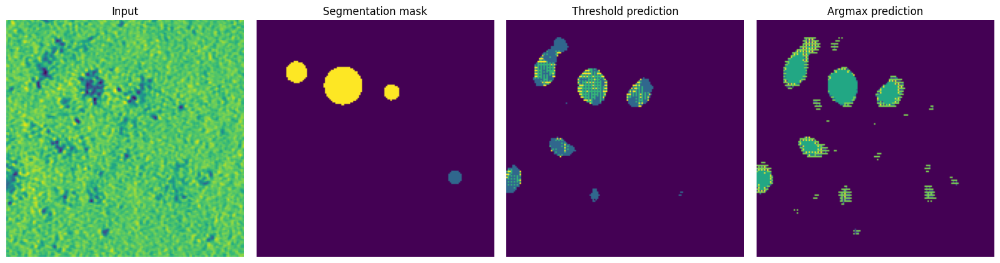

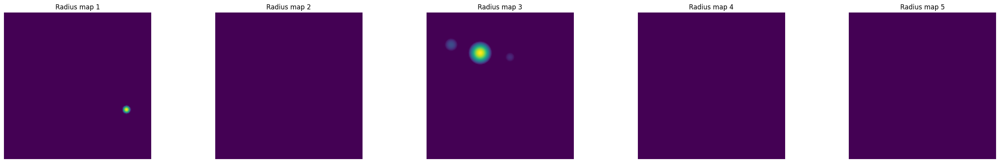

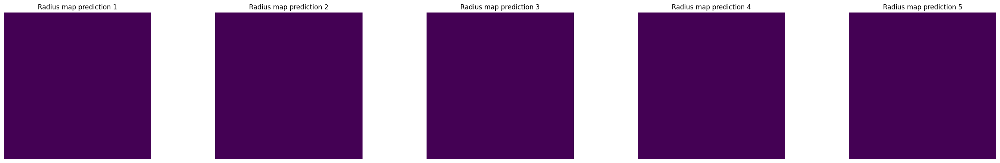

Epoch 3/10000, Train Loss: 0.7580, Val Loss: 0.7736
----------


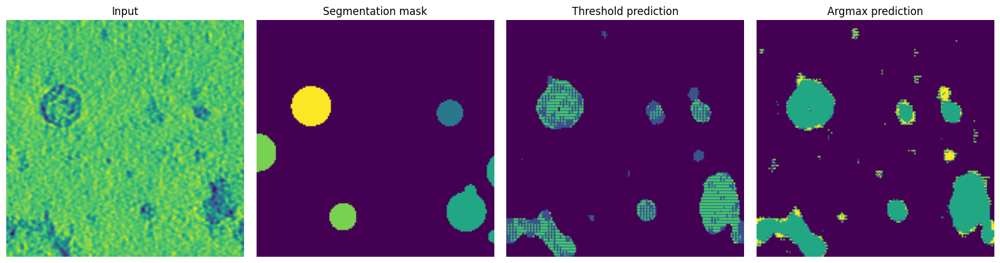

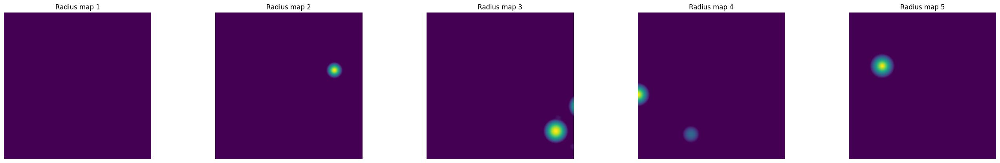

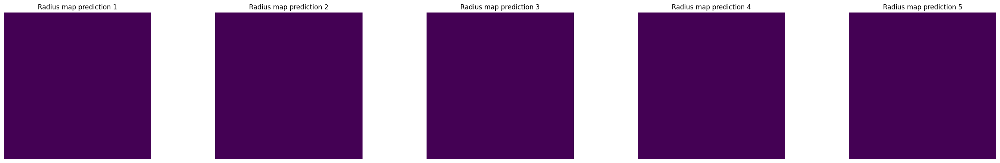

Epoch 4/10000, Train Loss: 0.7564, Val Loss: 0.7453
----------


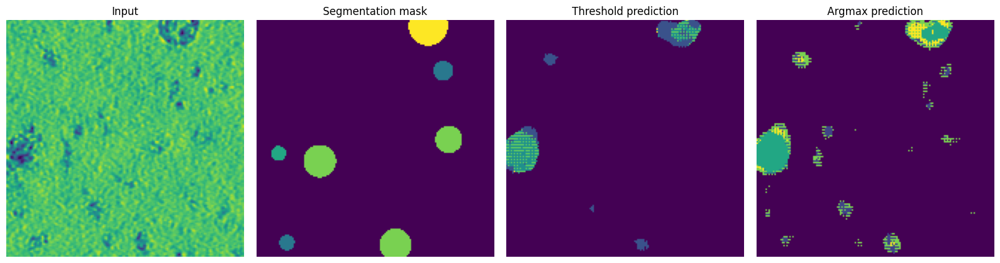

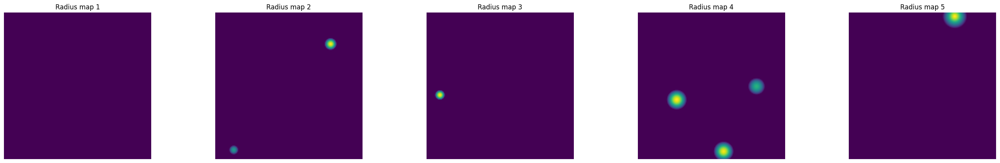

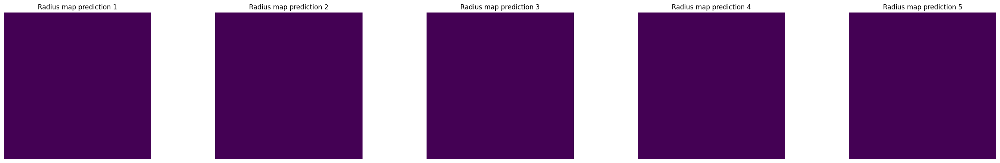

Epoch 5/10000, Train Loss: 0.7515, Val Loss: 0.6668
----------


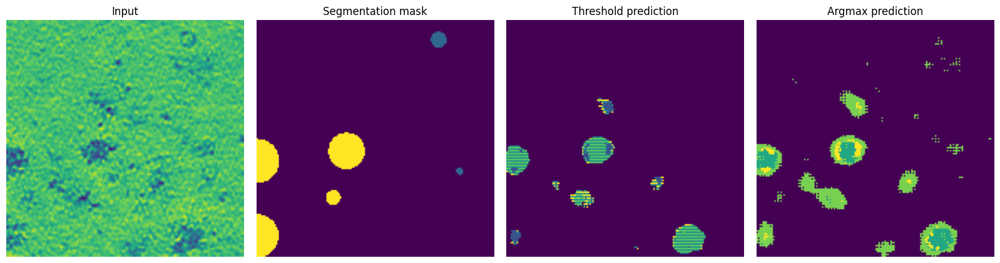

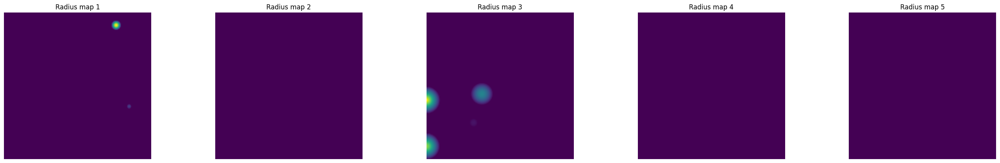

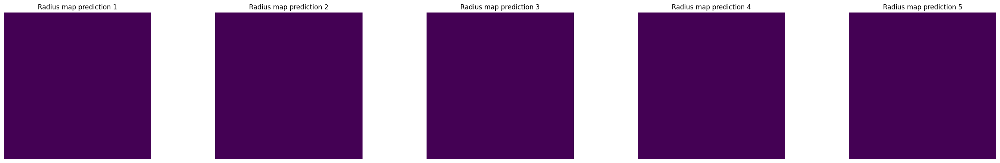

Epoch 6/10000, Train Loss: 0.7362, Val Loss: 0.7516
----------


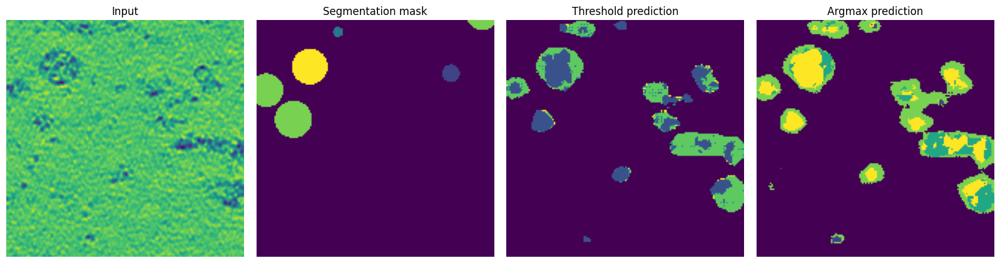

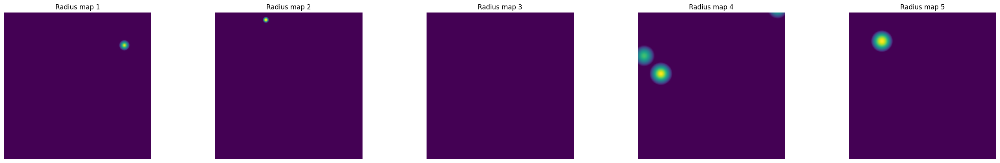

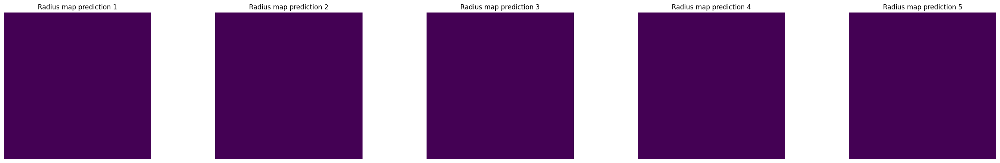

Epoch 7/10000, Train Loss: 0.7160, Val Loss: 0.6942
----------


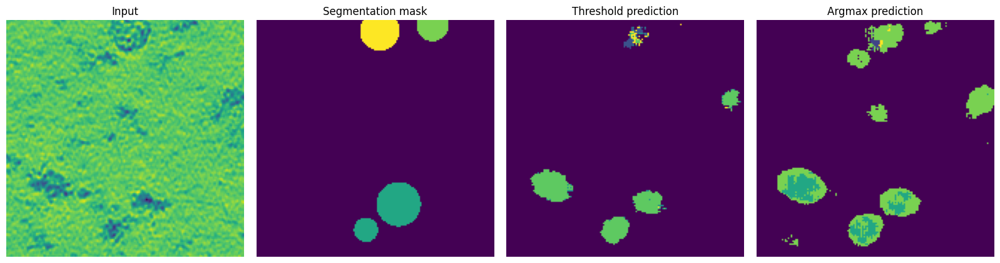

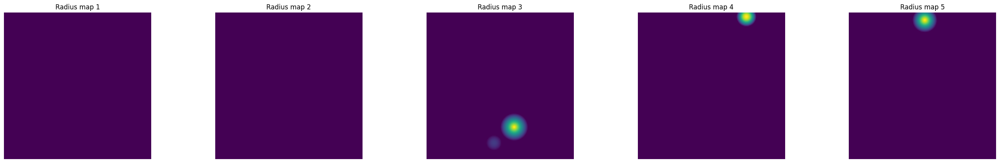

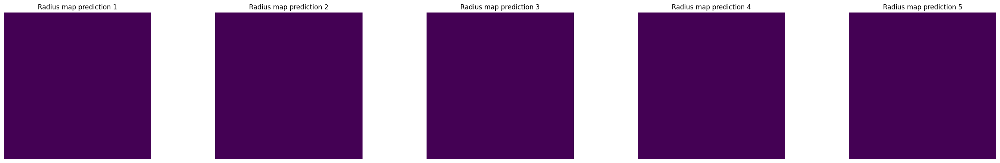

Epoch 8/10000, Train Loss: 0.6887, Val Loss: 0.6581
----------


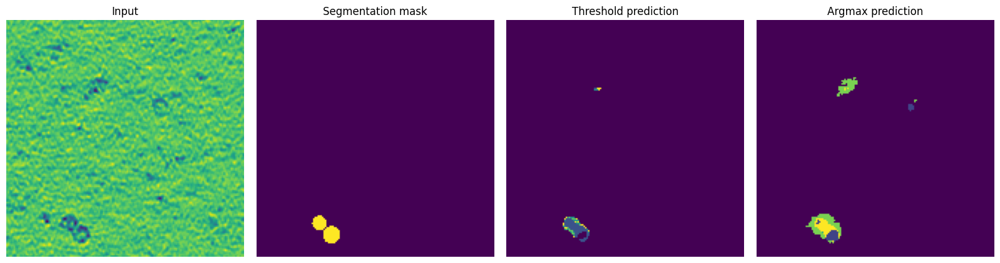

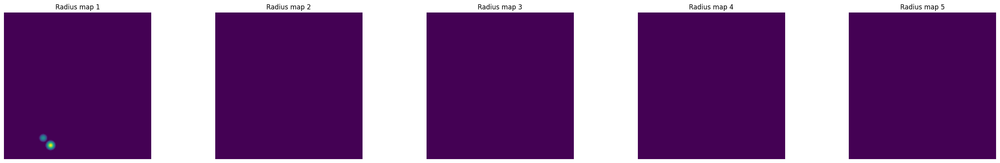

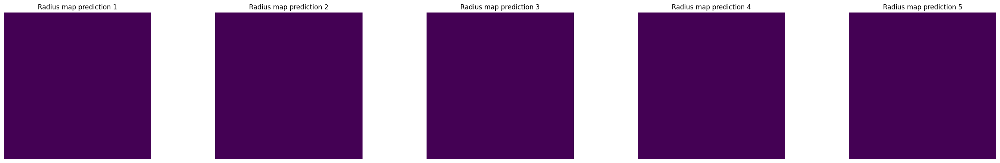

Epoch 9/10000, Train Loss: 0.6860, Val Loss: 0.5715
----------


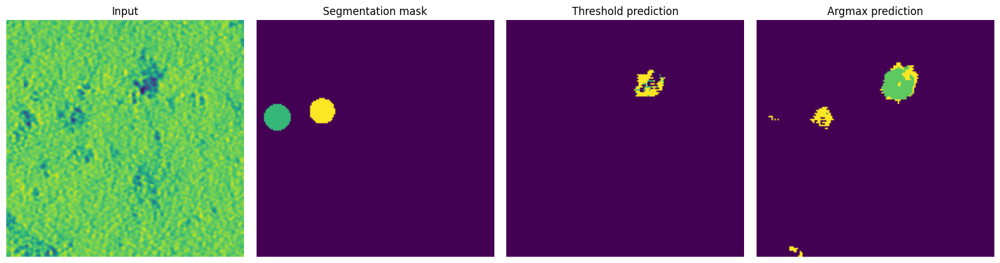

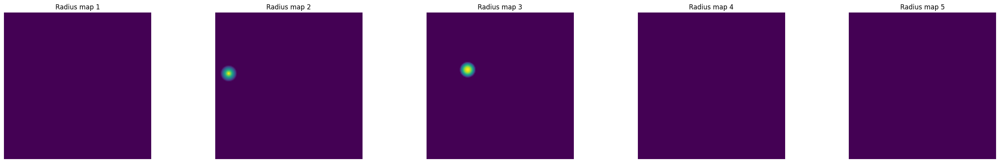

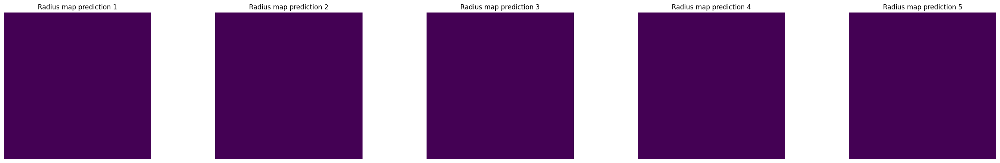

Epoch 10/10000, Train Loss: 0.6776, Val Loss: 0.6864
----------


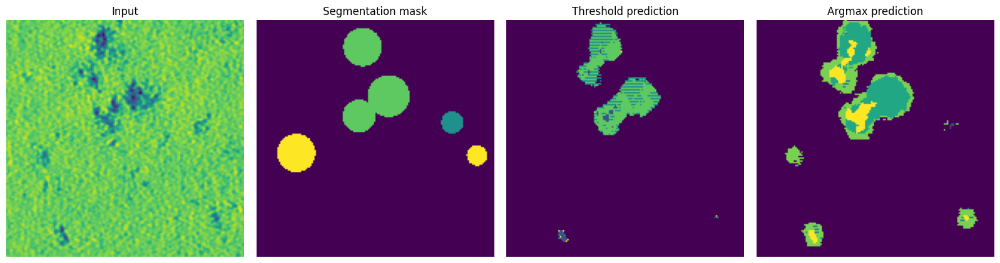

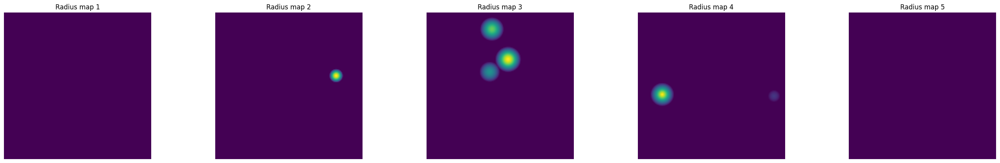

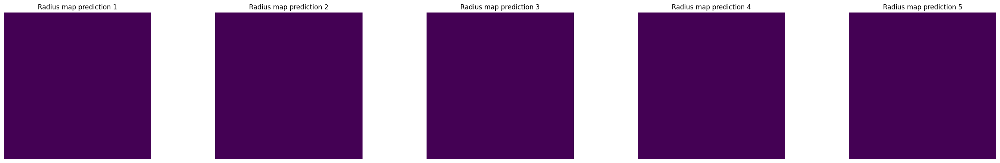

Epoch 11/10000, Train Loss: 0.6416, Val Loss: 0.5803
----------


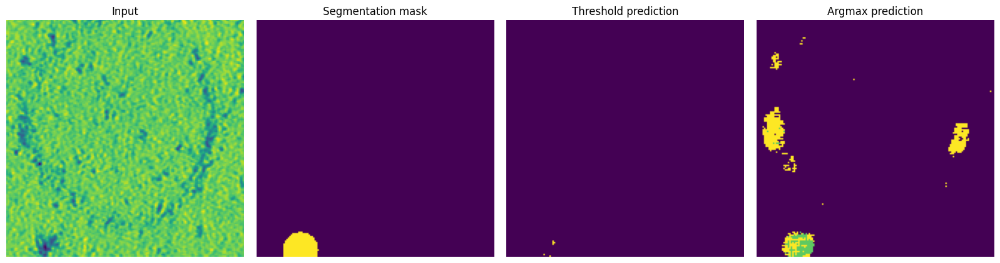

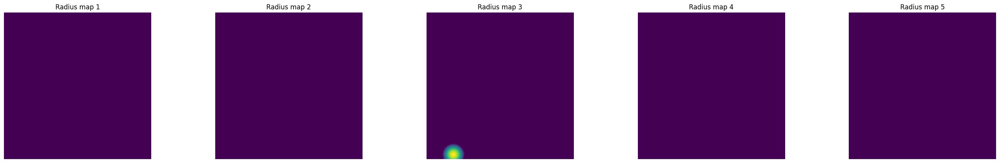

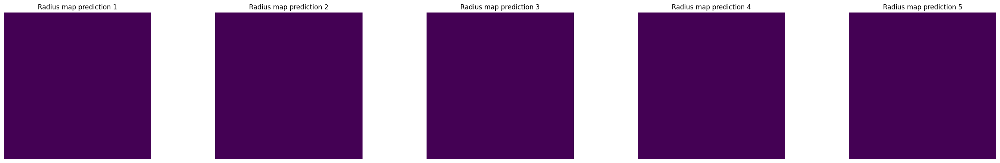

Epoch 12/10000, Train Loss: 0.6364, Val Loss: 0.6592
----------


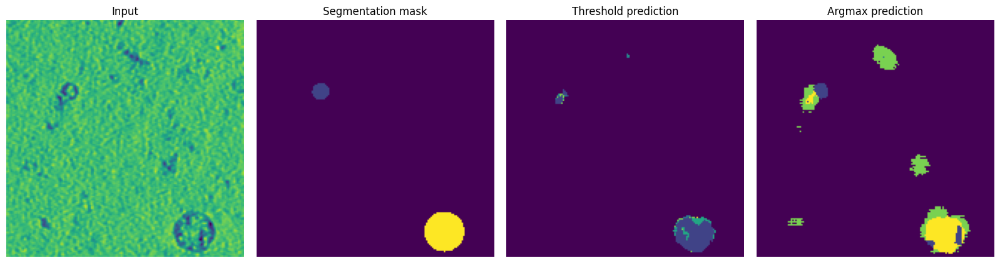

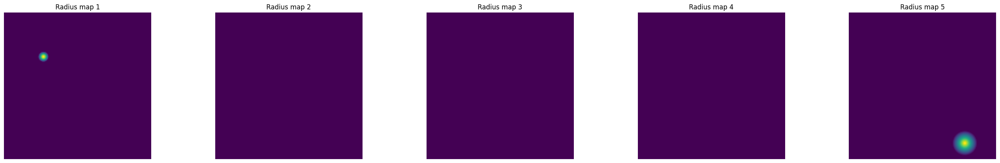

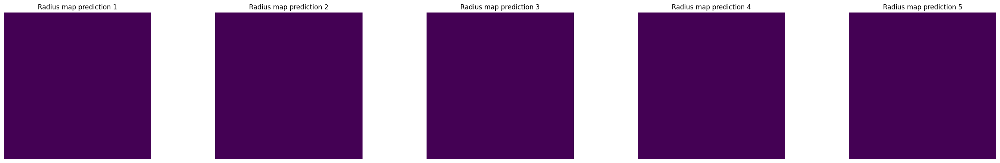

Epoch 13/10000, Train Loss: 0.6393, Val Loss: 0.6988
----------


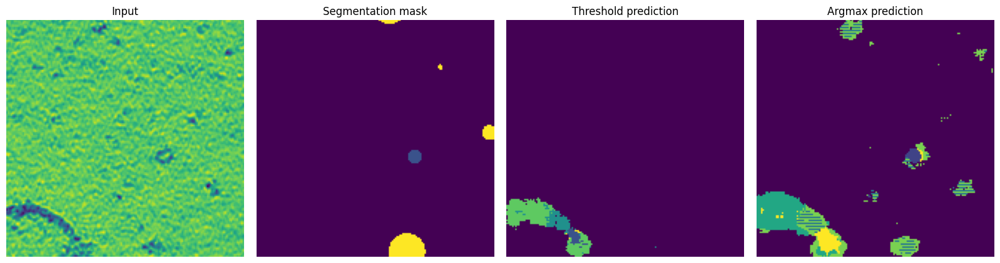

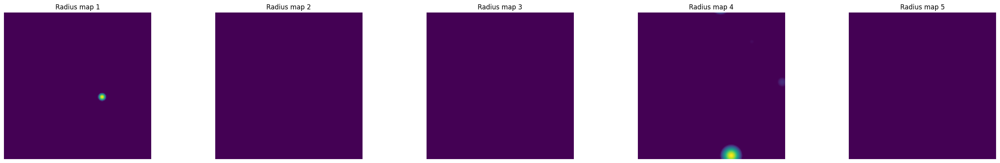

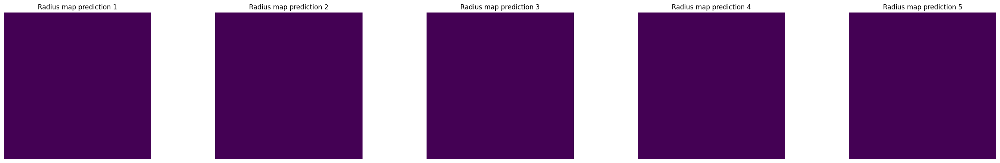

Epoch 14/10000, Train Loss: 0.6297, Val Loss: 0.5572
----------


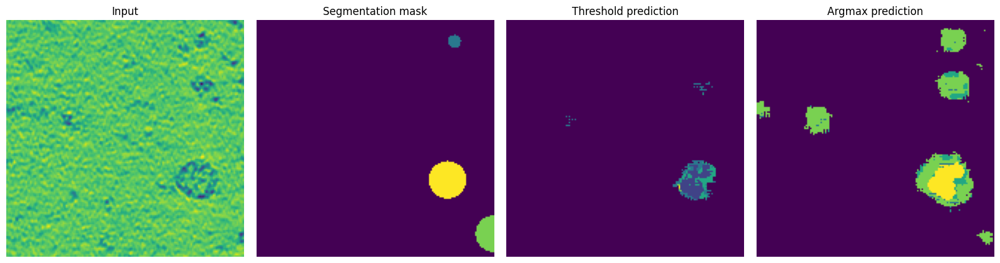

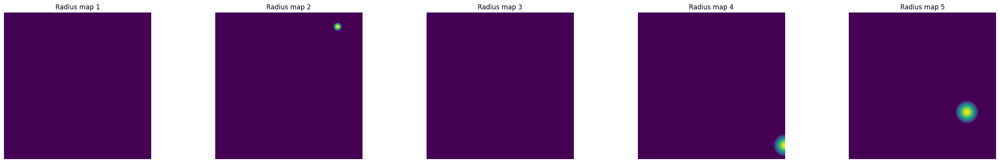

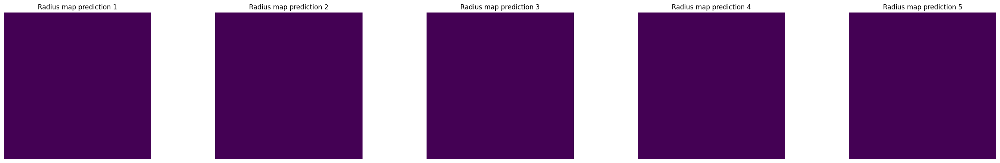

Epoch 15/10000, Train Loss: 0.6084, Val Loss: 0.5587
----------


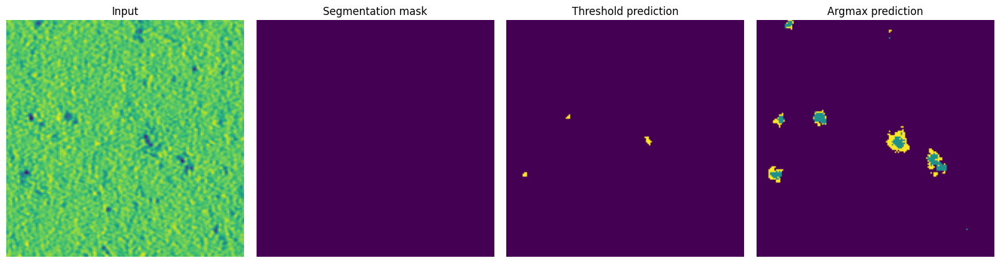

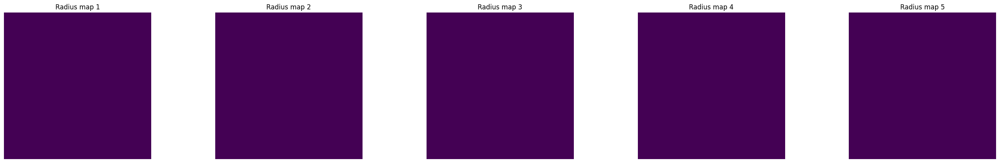

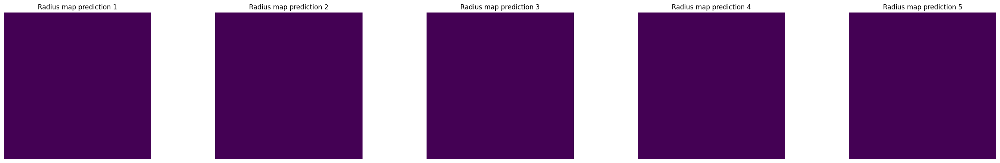

Epoch 16/10000, Train Loss: 0.6027, Val Loss: 0.6892
----------


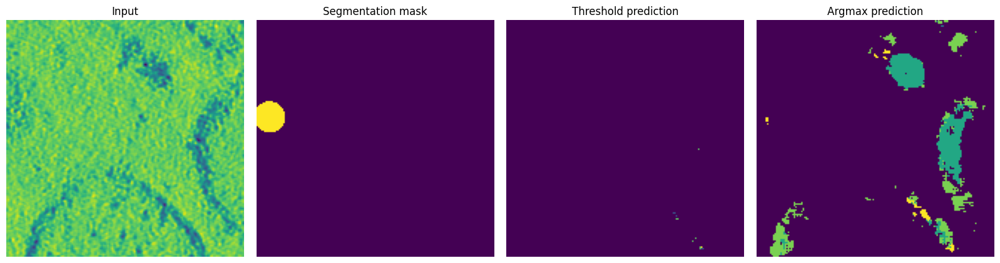

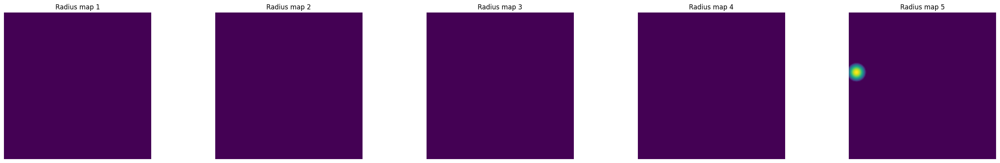

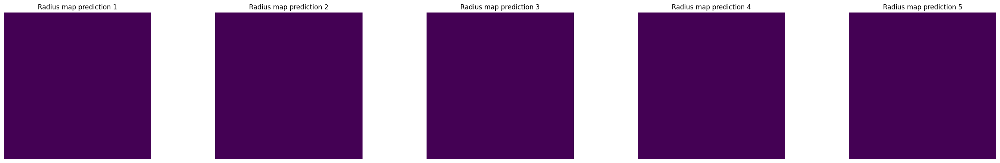

Epoch 17/10000, Train Loss: 0.6110, Val Loss: 0.6560
----------


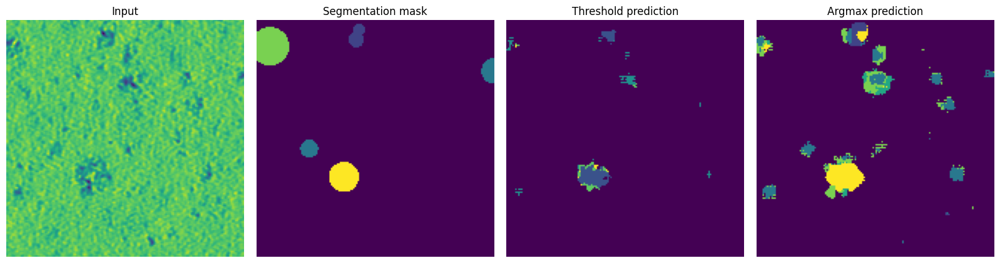

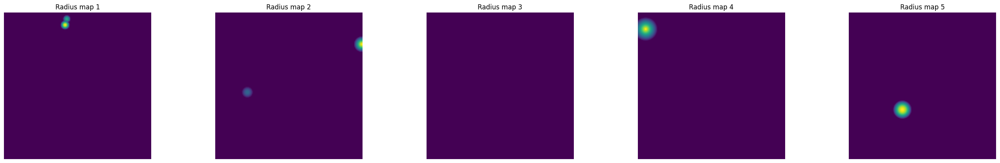

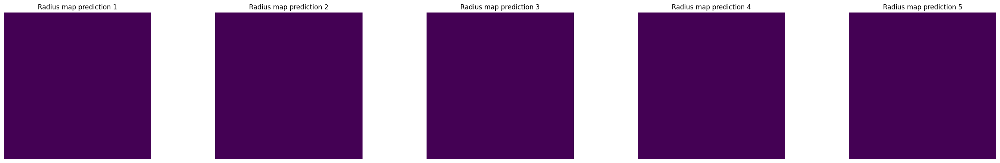

Epoch 18/10000, Train Loss: 0.6025, Val Loss: 0.6079
----------


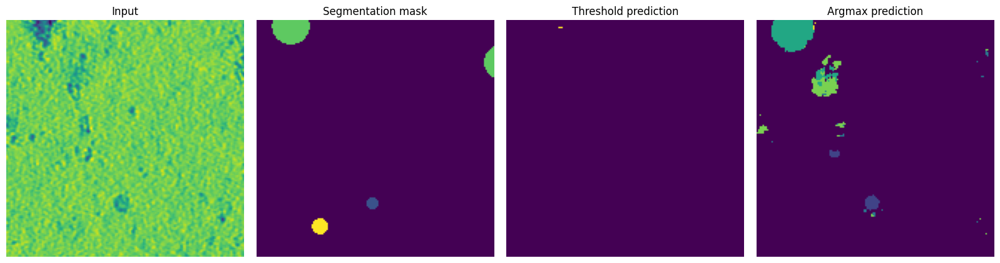

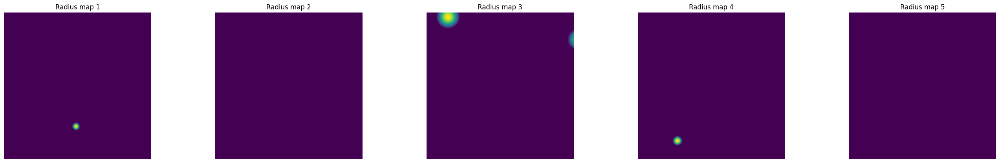

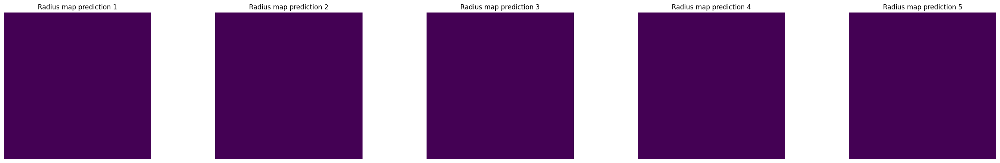

Epoch 19/10000, Train Loss: 0.6193, Val Loss: 0.6410
----------


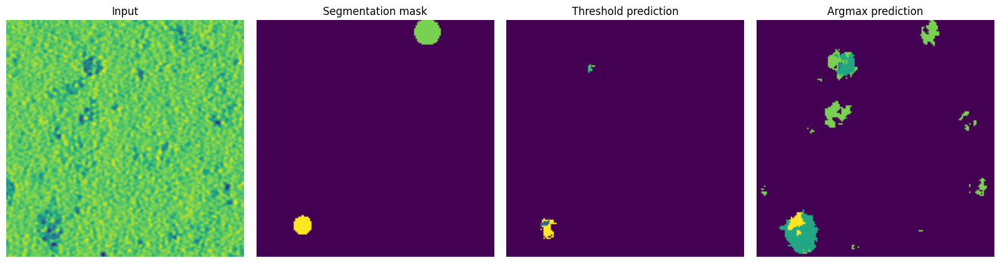

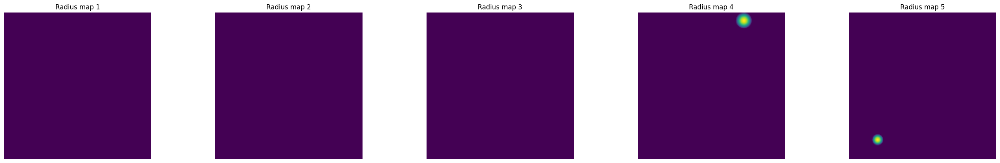

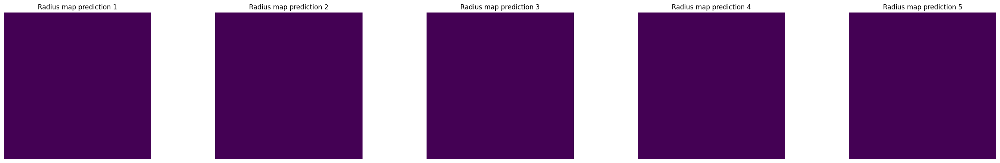

KeyboardInterrupt: 

In [66]:
optimizer = torch.optim.AdamW(model.parameters(), lr=learning_rate, weight_decay=5e-5)

torch.set_float32_matmul_precision('high')

#autocast_dtype = torch.bfloat16

best_val_score = 0.0
best_argmax_score = 0.0

max_epochs = 10000

writer = SummaryWriter("runs/experiment1")

early_stopping_count = 0
early_stopping_rounds = 100

best_model = None
best_argmax_model = None

for epoch in range(max_epochs):        
    print("-" * 10)
    model.train()
    epoch_loss = 0.0
    for sample_i in range(my_num_samples):
        for batch_idx, batch_data in enumerate(train_loader):
            inputs = batch_data[0].to(device, non_blocking=True)
            labels = batch_data[1].to(device, non_blocking=True)
            radius_input = batch_data[2].to(device, non_blocking=True)
    
            optimizer.zero_grad()
    
            #with torch.amp.autocast(device_type='cuda', dtype=autocast_dtype):
            outputs, radius_output = model(inputs)
    
            mask_loss = tversky_loss_function(outputs, labels)
            radius_loss = l1_loss(radius_input, radius_output)
    
            total_loss = mask_loss + radius_loss
    
            total_loss.backward()
            optimizer.step()
            
            epoch_loss += total_loss.item()
    
            
            if sample_i == 0 and batch_idx == 0:
    
                first_outputs = outputs[0]
                thresh_probs = first_outputs > prediction_threshold
                _, max_classes = thresh_probs.max(dim=0)
                threshold_mask = max_classes.cpu().numpy()
    
                argmax_tensor = torch.argmax(first_outputs, dim=0)
                argmax_mask = argmax_tensor.cpu().numpy()
                
    
                fig, axes = plt.subplots(1, 4, figsize=(16, 4))  # Adjust figsize to control spacing
    
                # label 1
                axes[0].imshow(inputs[0][0][80].cpu().numpy())
                axes[0].set_title('Input')
                axes[0].axis('off')
                
                # label 2
                axes[1].imshow(labels[0][0][80].cpu().numpy())
                axes[1].set_title('Segmentation mask')
                axes[1].axis('off')
                
                # label 3
                axes[2].imshow(threshold_mask[80])
                axes[2].set_title('Threshold prediction')
                axes[2].axis('off')
    
                # label 4
                axes[3].imshow(argmax_mask[80])
                axes[3].set_title('Argmax prediction')
                axes[3].axis('off')
    
                # Reduce spacing
                plt.subplots_adjust(wspace=0.05)  # Reduce horizontal space between images
                plt.tight_layout(pad=0.1, w_pad=0.1, h_pad=0.1)  # Further minimize padding
                
                plt.show()
    
                fig, axes = plt.subplots(1, 5, figsize=(28, 4))  # Adjust figsize to control spacing
    
                # prediction 1
                axes[0].imshow(radius_input[0][0][80].cpu().detach().numpy())
                axes[0].set_title('Radius map 1')
                axes[0].axis('off')
                
                # prediction 2
                axes[1].imshow(radius_input[0][1][80].cpu().detach().numpy())
                axes[1].set_title('Radius map 2')
                axes[1].axis('off')
                
                # prediction 3
                axes[2].imshow(radius_input[0][2][80].cpu().detach().numpy())
                axes[2].set_title('Radius map 3')
                axes[2].axis('off')
    
                # prediction 4
                axes[3].imshow(radius_input[0][3][80].cpu().detach().numpy())
                axes[3].set_title('Radius map 4')
                axes[3].axis('off')
    
                # prediction 5
                axes[4].imshow(radius_input[0][4][80].cpu().detach().numpy())
                axes[4].set_title('Radius map 5')
                axes[4].axis('off')
                
                # Reduce spacing
                plt.subplots_adjust(wspace=0.05)  # Reduce horizontal space between images
                plt.tight_layout(pad=0.1, w_pad=0.1, h_pad=0.1)  # Further minimize padding
                
                plt.show()
    
                ig, axes = plt.subplots(1, 5, figsize=(28, 4))  # Adjust figsize to control spacing
    
                # prediction 1
                axes[0].imshow(radius_output[0][0][80].cpu().detach().numpy())
                axes[0].set_title('Radius map prediction 1')
                axes[0].axis('off')
                
                # prediction 2
                axes[1].imshow(radius_output[0][1][80].cpu().detach().numpy())
                axes[1].set_title('Radius map prediction 2')
                axes[1].axis('off')
                
                # prediction 3
                axes[2].imshow(radius_output[0][2][80].cpu().detach().numpy())
                axes[2].set_title('Radius map prediction 3')
                axes[2].axis('off')
    
                # prediction 4
                axes[3].imshow(radius_output[0][3][80].cpu().detach().numpy())
                axes[3].set_title('Radius map prediction 4')
                axes[3].axis('off')
    
                # prediction 5
                axes[4].imshow(radius_output[0][4][80].cpu().detach().numpy())
                axes[4].set_title('Radius map prediction 5')
                axes[4].axis('off')
                
                # Reduce spacing
                plt.subplots_adjust(wspace=0.05)  # Reduce horizontal space between images
                plt.tight_layout(pad=0.1, w_pad=0.1, h_pad=0.1)  # Further minimize padding
                
                plt.show()
        
        
    train_loss = epoch_loss / len(train_loader) / my_num_samples

    running_val_loss = 0.0
    
    model.eval()
    with torch.no_grad():
        #with torch.amp.autocast(device_type='cuda', dtype=autocast_dtype):
        for val_batch_idx, batch_data in enumerate(val_loader):
            inputs = batch_data[0].to(device, non_blocking=True)
            labels = batch_data[1].to(device, non_blocking=True)
            radius_input = batch_data[2].to(device, non_blocking=True)

            outputs, radius_output = model(inputs)

            mask_loss = tversky_loss_function(outputs, labels)
            radius_loss = l1_loss(radius_input, radius_output)
    
            total_loss = mask_loss + radius_loss

            running_val_loss += total_loss.item()

        '''
        solution_dfs_list = []
        submission_dfs_list = []
        argmax_submission_dfs_list = []
        exp_names_list = []

        for first_i in range(len(val_files_copy)):
            val_data = val_files_copy[first_i]

            exp_name = val_data['label_df']['experiment'][0]
            if exp_name in exp_names_list:
                continue
            else:
                exp_names_list.append(exp_name)

            tomo = val_data['image']
            tomo_patches, coordinates = extract_3d_patches_minimal_overlap([tomo], cube_size)
            tomo_patched_data = [{"image": img} for img in tomo_patches]
            tomo_ds = CacheDataset(data=tomo_patched_data, transform=inference_transforms, cache_rate=1.0, progress=False, num_workers=8)
            
            avg_probs_list = []
            for second_i in range(len(tomo_ds)):
                input_tensor = tomo_ds[second_i]['image'].unsqueeze(0).to("cuda", non_blocking=True)
                avg_probs = ensemble_prediction_tta(model, input_tensor)
                avg_probs_list.append(avg_probs.cpu().numpy())

            reconstructed_tensor = reconstruct_prediction_array(avg_probs_list, coordinates, tomo.shape)
            argmax_tensor = torch.argmax(reconstructed_tensor, dim=0)
            thresh_probs = reconstructed_tensor > prediction_threshold
            _, max_classes = thresh_probs.max(dim=0)
            
            reconstructed_mask = max_classes.cpu().numpy()
            argmax_mask = argmax_tensor.cpu().numpy()

            if first_i == 0:
                # Create figure
                fig, axes = plt.subplots(1, 4, figsize=(16, 4))  # Adjust figsize to control spacing
                
                # Image 1
                axes[0].imshow(tomo[100])
                axes[0].set_title('Tomogram')
                axes[0].axis('off')
                
                # Image 2
                axes[1].imshow(val_data['label'][100])
                axes[1].set_title('Painted Segmentation')
                axes[1].axis('off')
                
                # Image 3
                axes[2].imshow(reconstructed_mask[100])
                axes[2].set_title('Threshold Prediction')
                axes[2].axis('off')
                
                # Image 4
                axes[3].imshow(argmax_mask[100])
                axes[3].set_title('Argmax Prediction')
                axes[3].axis('off')
                
                # Reduce spacing
                plt.subplots_adjust(wspace=0.05)  # Reduce horizontal space between images
                plt.tight_layout(pad=0.1, w_pad=0.1, h_pad=0.1)  # Further minimize padding
                
                plt.show()
            
            location = {}
            for c in classes:
                cc = cc3d.connected_components(reconstructed_mask == c)
                stats = cc3d.statistics(cc)
                zyx = stats['centroids'][1:]
                zyx_large = zyx[stats['voxel_counts'][1:] > 255]
                xyz = np.ascontiguousarray(zyx_large[:, ::-1])
                location[id_to_name[c]] = xyz
            df = dict_to_df(location, val_data['label_df']['experiment'][0])

            solution_df = val_data['label_df']

            solution_dfs_list.append(solution_df)
            submission_dfs_list.append(df)

            location = {}
            for c in classes:
                cc = cc3d.connected_components(argmax_mask == c)
                stats = cc3d.statistics(cc)
                zyx = stats['centroids'][1:]
                zyx_large = zyx[stats['voxel_counts'][1:] > 255]
                xyz = np.ascontiguousarray(zyx_large[:, ::-1])
                location[id_to_name[c]] = xyz
            df = dict_to_df(location, val_data['label_df']['experiment'][0])
            argmax_submission_dfs_list.append(df)

        solution_concat_df = pd.concat(solution_dfs_list, ignore_index=True).reset_index(drop=True)#.reset_index().rename(columns={'index':'id'})[['id', 'experiment', 'particle_type', 'x', 'y', 'z']]
        submission_concat_df = pd.concat(submission_dfs_list, ignore_index=True).reset_index(drop=True)#.reset_index().rename(columns={'index':'id'})
        argmax_submission_concat_df = pd.concat(argmax_submission_dfs_list, ignore_index=True).reset_index(drop=True)
        
        
        particle_names = ['apo-ferritin', 'beta-galactosidase', 'ribosome', 'thyroglobulin', 'virus-like-particle']
        particle_radius = {
            'apo-ferritin': 65,
            'beta-galactosidase': 95,
            'ribosome': 150,
            'thyroglobulin': 135,
            'virus-like-particle': 145,
        }
        
        val_fbeta_score = score(solution_concat_df, submission_concat_df, 'id', 0.1*0.5, 4)
        
        argmax_val_fbeta_score = score(solution_concat_df, argmax_submission_concat_df, 'id', 0.1*0.5, 4)

        if val_fbeta_score > best_val_score:
            best_val_score = val_fbeta_score
            early_stopping_count = 0
            best_model = copy.deepcopy(model)
            torch.save(best_model.state_dict(), os.path.join(output_path, f"best_threshold_model_{notebook_number}.pth"))

        if argmax_val_fbeta_score > best_argmax_score:
            best_argmax_score = argmax_val_fbeta_score
            early_stopping_count = 0
            best_argmax_model = copy.deepcopy(model)
            torch.save(best_argmax_model.state_dict(), os.path.join(output_path, f"best_argmax_model_{notebook_number}.pth"))
        '''

    early_stopping_count += 1

    val_loss = running_val_loss / len(val_loader)
    writer.add_scalars("Loss", {"Train": train_loss, "Validation": val_loss}, epoch)

    print(f"Epoch {epoch+1}/{max_epochs}, Train Loss: {train_loss:.4f}, Val Loss: {val_loss:.4f}")
    #print(f"Val Threshold F beta score: {val_fbeta_score:.4f}, Val Argmax F beta score: {argmax_val_fbeta_score:.4f}, Best Threshold Val F beta score: {best_val_score:.4f}, Best Argmax Val F beta score: {best_argmax_score:.4f}")

    gc.collect()

    #break
    
    if early_stopping_count >= early_stopping_rounds:
        print('Early Stopping Triggered.')
        break

# References

1. https://www.kaggle.com/code/hideyukizushi/czii-yolo11-unet3d-monai-lb-707